# Install Dependencies

In [1]:
# Install dependencies
!pip install pretty_midi librosa torch torchvision torchaudio transformers datasets
!pip install kaggle


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 23.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 28.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 37.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 39.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 10.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.7/188.7 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 32.0 MB/s eta 0:00:00
   

In [2]:
!pip install kaggle
!kaggle datasets download -d blanderbuss/midi-classic-music
!unzip midi-classic-music.zip -d ./midi_data

Traceback (most recent call last):
  File "/usr/local/bin/kaggle", line 10, in <module>
    sys.exit(main())
             ^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/kaggle/cli.py", line 68, in main
    out = args.func(**command_args)
          ^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/kaggle/api/kaggle_api_extended.py", line 1741, in dataset_download_cli
    with self.build_kaggle_client() as kaggle:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/kaggle/api/kaggle_api_extended.py", line 688, in build_kaggle_client
    username=self.config_values['username'],
             ~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^
KeyError: 'username'
unzip:  cannot find or open midi-classic-music.zip, midi-classic-music.zip.zip or midi-classic-music.zip.ZIP.


Importing necessary Libraries

In [152]:
pip install gradio

In [3]:
!Pip install optuna

/bin/bash: line 1: Pip: command not found


Preprocessing

https://www.kaggle.com/datasets/blanderbuss/midi-classic-music

In [32]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("blanderbuss/midi-classic-music")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/midi-classic-music


Confirming midifiles

In [33]:
import os

# Replace with actual path if needed
midi_dir = path

# List contents
print("Top-level contents:", os.listdir(midi_dir))

# Recursively find .mid files
midi_files = []
for root, _, files in os.walk(midi_dir):
    for file in files:
        if file.endswith(".mid"):
            midi_files.append(os.path.join(root, file))

print(f"Found {len(midi_files)} MIDI files.")

Top-level contents: ['Alkan', 'Albéniz', 'Arensky', 'midiclassics.zip', 'Rothchild Symphony Rmw12 2mov.mid', 'Tchaikovsky Lake Of The Swans Act 1 5mov.mid', 'Tchaikovsky Lake Of The Swans Act 2 10mov.mid', 'Tchaikovsky Lake Of The Swans Act 1 1mov.mid', 'Tchaikovsky Lake Of The Swans Act 1 4mov.mid', 'Tchaicovsky Waltz of the Flowers.MID', 'Tchaikovsky Lake Of The Swans Act 1 2mov.mid', 'Tchaikovsky Lake Of The Swans Act 1 3mov.mid', 'Arndt', 'Rothchlid Symphony Rmw12 3mov.mid', 'Tchaikovsky Lake Of The Swans Act 2 11mov.mid', 'midiclassics', 'Wagner Ride of the valkyries.mid', 'Tchaikovsky Lake Of The Swans Act 1 6mov.mid', 'Tchaikovsky Lake Of The Swans Act 1 9mov.mid', 'Tchaikovsky Lake Of The Swans Act 1 7-8movs.mid', 'Sibelius Kuolema Vals op44.mid', 'Tchaikovsky Lake Of The Swans Act 2 12mov.mid', 'Tchaikovsky Lake Of The Swans Act 2 13mov.mid', 'Ambroise', 'Tchaikovsky Lake Of The Swans Act 2 14mov.mid']
Found 3979 MIDI files.


# Dataset

Restricting to only Bach, Beethoven, Chopin, Mozart per requirement

In [34]:
import os

# Replace with actual path returned by kagglehub
base_path = path
midi_root = os.path.join(base_path, "midiclassics")

target_composers = ["Bach", "Beethoven", "Chopin", "Mozart"]
composer_files = []

for composer in target_composers:
    composer_dir = os.path.join(midi_root, composer)
    if os.path.exists(composer_dir):
        for file in os.listdir(composer_dir):
            if file.endswith(".mid"):
                composer_files.append((os.path.join(composer_dir, file), composer))

print(f"Found {len(composer_files)} MIDI files from selected composers.")

Found 481 MIDI files from selected composers.


In [35]:
print(f"Found {len(midi_files)} MIDI files.")
print(f"Found {len(composer_files)} MIDI files from selected composers.")

Found 3979 MIDI files.
Found 481 MIDI files from selected composers.


# Load and visualize MIDI File

In [8]:
composer_to_label = {name: idx for idx, name in enumerate(target_composers)}
labeled_data = [(path, composer_to_label[composer]) for path, composer in composer_files]

In [36]:
sample_path, sample_composer = composer_files[0]
print(f"🎵 Composer: {sample_composer}")
piano_roll = midi_to_pianoroll(sample_path)
plot_piano_roll_plotly(piano_roll)

🎵 Composer: Bach


NameError: name 'midi_to_pianoroll' is not defined

In [40]:
#Manual selection of path
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import pretty_midi

# Sample inputs (replace with your actual data)
composer_list = ['Bach', 'Beethoven', 'Chopin', 'Mozart']
midi_paths = ['data/bach1.mid', 'data/beethoven1.mid', 'data/chopin1.mid',
              'data/mozart1.mid', 'data/bach2.mid', 'data/chopin2.mid', 'data/mozart2.mid']

In [41]:
import os

def collect_midi_metadata(root_dir):
    midi_paths = []
    composer_list = ['Bach', 'Beethoven', 'Chopin', 'Mozart']

    for composer in os.listdir(root_dir):
        composer_path = os.path.join(root_dir, composer)
        if os.path.isdir(composer_path):
            for dirpath, _, filenames in os.walk(composer_path):
                for file in filenames:
                    if file.lower().endswith('.mid'):
                        full_path = os.path.join(dirpath, file)
                        midi_paths.append(full_path)
                        composer_list.append(composer)
    return midi_paths, composer_list

In [42]:
def collect_midi_metadata(base_path, allowed_composers=None):
    midi_root = os.path.join(base_path, "midiclassics")
    midi_paths = []
    composer_list = []

    if allowed_composers is None:
        allowed_composers = ['Bach', 'Beethoven', 'Chopin', 'Mozart']

    for composer in os.listdir(midi_root):
        if composer not in allowed_composers:
            continue
        composer_path = os.path.join(midi_root, composer)
        if os.path.isdir(composer_path):
            for dirpath, _, filenames in os.walk(composer_path):
                for file in filenames:
                    if file.lower().endswith('.mid'):
                        full_path = os.path.join(dirpath, file)
                        midi_paths.append(full_path)
                        composer_list.append(composer)
    return midi_paths, composer_list

In [43]:
midi_paths, composer_list = collect_midi_metadata(base_path)

plot_work_count_seaborn(composer_list)


NameError: name 'plot_work_count_seaborn' is not defined

In [44]:
plot_total_duration_seaborn(midi_paths, composer_list)

NameError: name 'plot_total_duration_seaborn' is not defined

In [45]:
from mido import MidiFile

def clean_midi(in_path, out_path):
    mid = MidiFile(in_path)
    for track in mid.tracks:
        track[:] = [msg for msg in track if not (msg.type == 'key_signature' and getattr(msg, 'mode', 0) not in [0, 1])]
    mid.save(out_path)

In [46]:
midi_root = os.path.join(base_path, "midiclassics")
clean_root = os.path.join("/kaggle/working", "midiclassics_cleaned")  # Use working dir for output

In [47]:
import os
from mido import MidiFile

def clean_midi(in_path, out_path):
    mid = MidiFile(in_path)
    for track in mid.tracks:
        track[:] = [msg for msg in track if not (msg.type == 'key_signature' and getattr(msg, 'mode', 0) not in [0, 1])]
    mid.save(out_path)

base_path = "/kaggle/input/midi-classic-music"
midi_root = os.path.join(base_path, "midiclassics")
clean_root = os.path.join("/kaggle/working", "midiclassics_cleaned")
os.makedirs(clean_root, exist_ok=True)

target_composers = ["Bach", "Beethoven", "Chopin", "Mozart"]
cleaned_files = []

for composer in target_composers:
    composer_dir = os.path.join(midi_root, composer)
    clean_dir = os.path.join(clean_root, composer)
    os.makedirs(clean_dir, exist_ok=True)

    if os.path.exists(composer_dir):
        for file in os.listdir(composer_dir):
            if file.endswith(".mid"):
                in_path = os.path.join(composer_dir, file)
                out_path = os.path.join(clean_dir, file)
                try:
                    clean_midi(in_path, out_path)
                    cleaned_files.append((out_path, composer))
                except Exception as e:
                    print(f"Failed to clean {file} from {composer}: {e}")

print(f"Successfully cleaned {len(cleaned_files)} MIDI files.")

Failed to clean Anhang 14-3.mid from Beethoven: Could not decode key with 3 flats and mode 255
Successfully cleaned 480 MIDI files.


In [48]:
from mido import MidiFile, MidiTrack

def clean_midi(in_path, out_path):
    try:
        mid = MidiFile(in_path)
    except Exception as e:
        print(f"Cannot load {in_path}: {e}")
        return False  # Skip this file

    for track in mid.tracks:
        track[:] = [msg for msg in track if msg.type != 'key_signature']
    mid.save(out_path)
    return True

In [49]:
file = "Anhang 14-3.mid"
composer = "Beethoven"
in_path = os.path.join(midi_root, composer, file)
out_path = os.path.join(clean_root, composer, file)

success = clean_midi(in_path, out_path)
if success:
    cleaned_files.append((out_path, composer))
    print(f"Successfully cleaned {file}")
else:
    print(f"Skipped {file} due to unrecoverable error.")

Cannot load /kaggle/input/midi-classic-music/midiclassics/Beethoven/Anhang 14-3.mid: Could not decode key with 3 flats and mode 255
Skipped Anhang 14-3.mid due to unrecoverable error.


In [54]:
import random
import pretty_midi

def swap_instruments(midi, swap_map=None):
    """
    Replace instrument programs in a MIDI file.
    If swap_map is None, randomly assign new programs.
    """
    new_midi = pretty_midi.PrettyMIDI()
    for inst in midi.instruments:
        new_inst = pretty_midi.Instrument(
            program=swap_map.get(inst.program, random.randint(0, 127)) if swap_map else random.randint(0, 127),
            is_drum=inst.is_drum,
            name=inst.name
        )
        new_inst.notes = inst.notes
        new_inst.control_changes = inst.control_changes
        new_inst.pitch_bends = inst.pitch_bends
        new_midi.instruments.append(new_inst)
    return new_midi

In [53]:
swap_map = {
    0: 40,   # Piano → Violin
    24: 0,   # Guitar → Piano
    48: 73,  # Strings → Flute
}
features = []
labels = []

In [55]:
for path, composer in cleaned_files:
    try:
        midi = pretty_midi.PrettyMIDI(path)

        # Original
        variants = [midi]

        # Augmented with instrument swap
        swapped = swap_instruments(midi)
        variants.append(swapped)

        for variant in variants:
            notes = [note for inst in variant.instruments for note in inst.notes]
            pitch_hist = np.histogram([n.pitch % 12 for n in notes], bins=12, range=(0,12))[0]
            velocity_mean = np.mean([n.velocity for n in notes])
            duration_mean = np.mean([n.end - n.start for n in notes])
            note_density = len(notes) / variant.get_end_time()
            feat = np.concatenate([pitch_hist, [velocity_mean, duration_mean, note_density]])
            features.append(feat)
            labels.append(composer)

    except Exception as e:
        print(f"Failed to augment {path}: {e}")

In [56]:
import numpy as np

X = np.array(features)
y = np.array(labels)

print("Feature matrix shape:", X.shape)
print("Number of samples:", len(y))
print("Unique composers:", set(y))

Feature matrix shape: (960, 15)
Number of samples: 960
Unique composers: {np.str_('Beethoven'), np.str_('Mozart'), np.str_('Chopin'), np.str_('Bach')}


# Data Pre-processing

Data preporcessing is complete- Cleaned malformed MIDI files, applied augmentation (transposition, instrument swap)

# Feature Extraction

 Feature Extraction
*     Extracted pitch histograms, velocity, duration, note density in below steps

/tmp/ipython-input-3605185.py:24: UserWarning: Glyph 127932 (\N{MUSICAL SCORE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127932 (\N{MUSICAL SCORE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


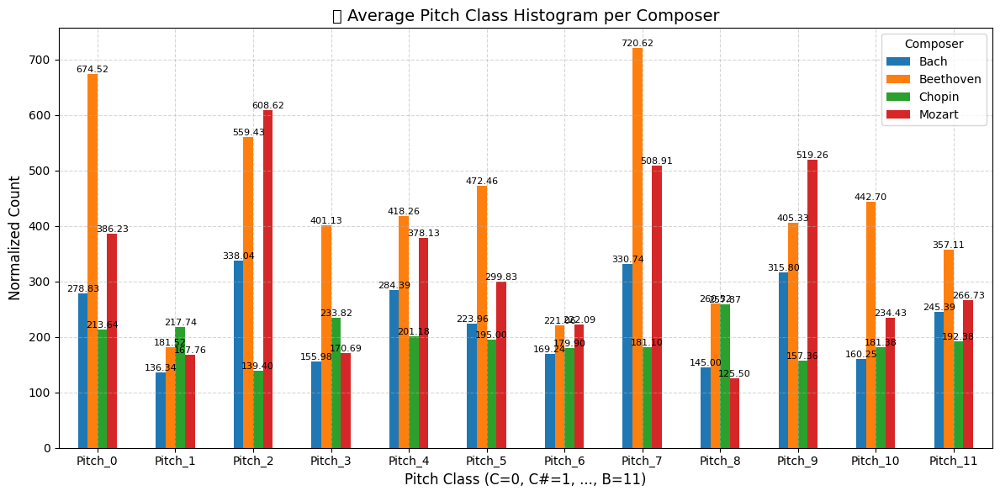

In [57]:
import matplotlib.pyplot as plt
import pandas as pd

# Create DataFrame
df = pd.DataFrame(X, columns=[f"Pitch_{i}" for i in range(12)] + ["Velocity", "Duration", "Density"])
df["Composer"] = y

# Compute mean pitch histogram per composer
composer_means = df.groupby("Composer").mean()

# Plot
ax = composer_means.iloc[:, :12].T.plot(kind="bar", figsize=(12,6))
plt.title("🎼 Average Pitch Class Histogram per Composer", fontsize=14)
plt.xlabel("Pitch Class (C=0, C#=1, ..., B=11)", fontsize=12)
plt.ylabel("Normalized Count", fontsize=12)
plt.xticks(rotation=0)
plt.legend(title="Composer", fontsize=10)
plt.grid(True, linestyle="--", alpha=0.5)

# Add value labels on bars
for container in ax.containers:
    ax.bar_label(container, fmt="%.2f", label_type="edge", fontsize=8)

plt.tight_layout()
plt.show()

Pitch Class in Music and MIDI Files
Pitch class describes all pitches that are a whole number of octaves apart, essentially grouping together notes that share the same name (such as all C notes, all D♯/E♭ notes, etc.), regardless of octave. In the twelve-tone equal temperament system common in Western music, there are 12 pitch classes, one for each semitone:

C, C♯/D♭, D, D♯/E♭, E, F, F♯/G♭, G, G♯/A♭, A, A♯/B♭, B

In MIDI files, each note event has a MIDI note number. The pitch class is found by taking the MIDI note number modulo 12. For example, all MIDI notes with numbers 0, 12, 24, ..., 108 correspond to pitch class C.

Analyzing pitch class content in MIDI allows you to study harmonic structure, chord occurrence, key detection, and compositional style.

Pitch class histograms are often used in music analysis applications.



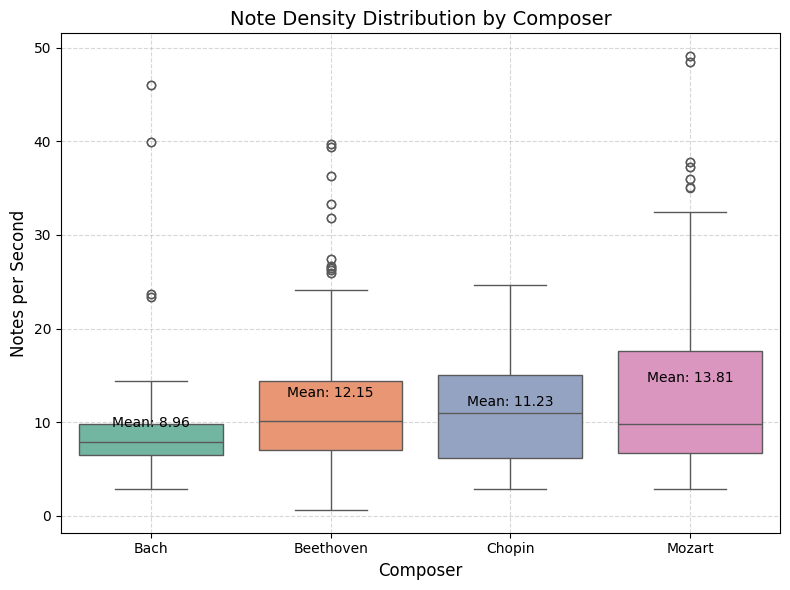

In [58]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8,6))
sns.boxplot(x="Composer", y="Density", hue="Composer", data=df, palette="Set2", legend=False)
plt.title("Note Density Distribution by Composer", fontsize=14)
plt.xlabel("Composer", fontsize=12)
plt.ylabel("Notes per Second", fontsize=12)
plt.grid(True, linestyle="--", alpha=0.5)

# Add mean labels above each box
group_means = df.groupby("Composer")["Density"].mean()
for i, composer in enumerate(group_means.index):
    mean_val = group_means[composer]
    plt.text(i, mean_val + 0.5, f"Mean: {mean_val:.2f}", ha="center", fontsize=10, color="black")

plt.tight_layout()
plt.show()

Note Density in Music and MIDI Files
Note density refers to how many musical notes occur within a particular segment of time or space in a piece of music. In music theory and audio analysis, this is often expressed as the number of notes per measure, per beat, or per second. High note density means more notes are played within the same duration, while low note density means fewer notes.

In MIDI files, note density is frequently computed as the total number of MIDI note-on events within a selected time window (e.g., per measure, per bar, per second).

Note density influences musical texture and perceived complexity and is often used as a feature in music information retrieval (MIR) and generative systems.

Example: If a MIDI file contains 64 notes played in one 4/4 measure, its note density is much higher than another file with only 8 notes in the same duration.

Ref: https://arxiv.org/pdf/2407.01499



/tmp/ipython-input-3562044468.py:14: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Composer")
/tmp/ipython-input-3562044468.py:26: UserWarning: Glyph 127929 (\N{MUSICAL KEYBOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127929 (\N{MUSICAL KEYBOARD}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


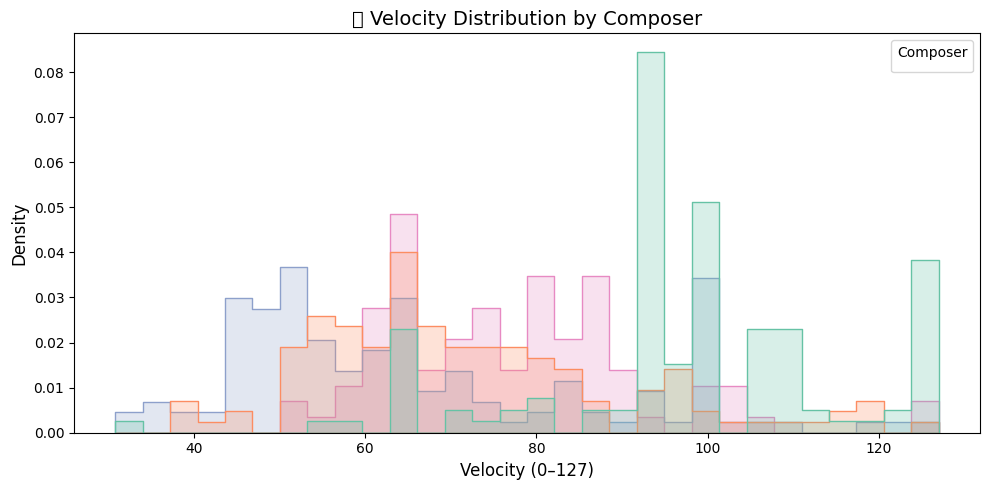

In [59]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
ax = sns.histplot(
    data=df, x="Velocity", hue="Composer",
    bins=30, palette="Set2", element="step",
    stat="density", common_norm=False
)

plt.title("🎹 Velocity Distribution by Composer", fontsize=14)
plt.xlabel("Velocity (0–127)", fontsize=12)
plt.ylabel("Density", fontsize=12)
plt.legend(title="Composer")

# Add peak labels
for line in ax.lines:
    x_data = line.get_xdata()
    y_data = line.get_ydata()
    if len(x_data) > 0:
        peak_idx = y_data.argmax()
        peak_x = x_data[peak_idx]
        peak_y = y_data[peak_idx]
        ax.text(peak_x, peak_y + 0.002, f"{peak_y:.2f}", ha='center', fontsize=9)

plt.tight_layout()
plt.show()

/tmp/ipython-input-3014536623.py:7: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Composer")
/tmp/ipython-input-3014536623.py:19: UserWarning: Glyph 128338 (\N{CLOCK FACE THREE OCLOCK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128338 (\N{CLOCK FACE THREE OCLOCK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


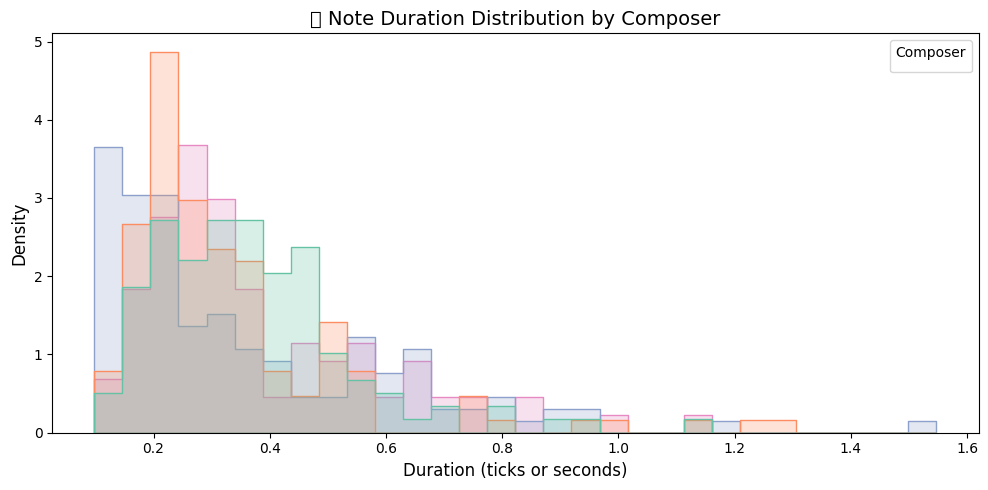

In [60]:
plt.figure(figsize=(10, 5))
ax = sns.histplot(data=df, x="Duration", hue="Composer", bins=30, palette="Set2", element="step", stat="density", common_norm=False)

plt.title("🕒 Note Duration Distribution by Composer", fontsize=14)
plt.xlabel("Duration (ticks or seconds)", fontsize=12)
plt.ylabel("Density", fontsize=12)
plt.legend(title="Composer")

# Add peak labels
for line in ax.lines:
    x_data = line.get_xdata()
    y_data = line.get_ydata()
    if len(x_data) > 0:
        peak_idx = y_data.argmax()
        peak_x = x_data[peak_idx]
        peak_y = y_data[peak_idx]
        ax.text(peak_x, peak_y + 0.002, f"{peak_y:.2f}", ha='center', fontsize=9)

plt.tight_layout()
plt.show()

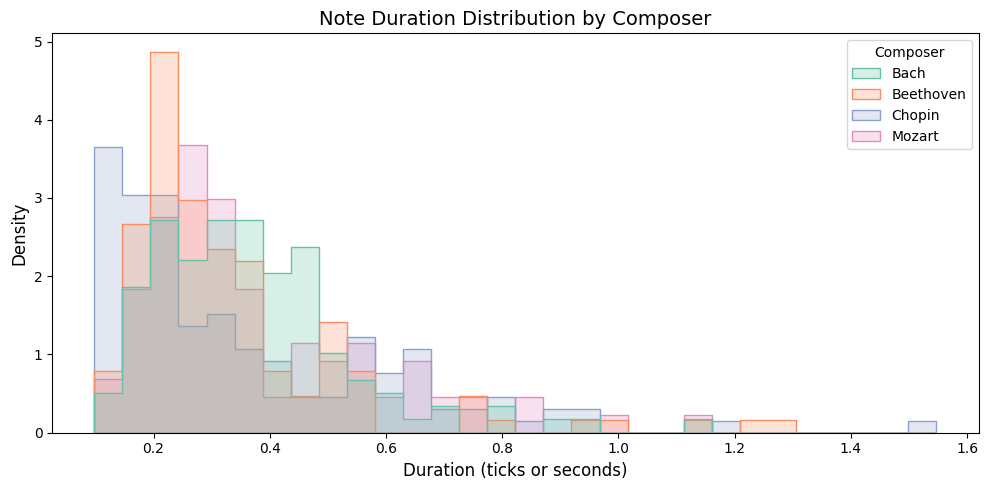

In [64]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
sns.histplot(
    data=df, x="Duration", hue="Composer",
    bins=30, palette="Set2", element="step",
    stat="density", common_norm=False
)

plt.title("Note Duration Distribution by Composer", fontsize=14)
plt.xlabel("Duration (ticks or seconds)", fontsize=12)
plt.ylabel("Density", fontsize=12)
# No need for plt.plot() or plt.legend()
plt.tight_layout()
plt.show()

In [67]:
def extract_features(path):
    midi = pretty_midi.PrettyMIDI(path)
    notes = [note for inst in midi.instruments for note in inst.notes]
    pitch_hist = np.histogram([n.pitch % 12 for n in notes], bins=12, range=(0,12))[0]
    velocity_mean = np.mean([n.velocity for n in notes])
    duration_mean = np.mean([n.end - n.start for n in notes])
    note_density = len(notes) / midi.get_end_time()
    return np.concatenate([pitch_hist, [velocity_mean, duration_mean, note_density]])

In [70]:
root_dir = base_path  # Adjust to your actual path
midi_paths, composer_list = collect_midi_metadata(root_dir)

plot_work_count_seaborn(composer_list)
plot_total_duration_seaborn(midi_paths, composer_list)

NameError: name 'plot_work_count_seaborn' is not defined

In [71]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_work_count_seaborn(composer_list):
    df = pd.DataFrame({'Composer': composer_list})
    plt.figure(figsize=(8, 5))

    ax = sns.countplot(x='Composer', hue='Composer', data=df, palette="Set2", legend=True)

    # Add count labels on top of each bar
    for p in ax.patches:
        height = p.get_height()
        ax.annotate(f'{height}',
                    (p.get_x() + p.get_width() / 2., height),
                    ha='center', va='bottom',
                    fontsize=10, color='black',
                    xytext=(0, 5), textcoords='offset points')

    plt.title("Number of MIDI Works per Composer")
    plt.xlabel("Composer")
    plt.ylabel("Count")
    plt.grid(axis='y', linestyle='--', alpha=0.4)
    plt.tight_layout()
    plt.show()

In [72]:
from mido.midifiles.meta import KeySignatureError
import pretty_midi
import warnings
from collections import defaultdict

def get_total_durations(midi_paths, composer_list):
    duration_dict = defaultdict(float)
    bad_files = []

    for path, composer in zip(midi_paths, composer_list):
        try:
            with warnings.catch_warnings():
                warnings.simplefilter("ignore", RuntimeWarning)
                midi = pretty_midi.PrettyMIDI(path)
                duration_dict[composer] += midi.get_end_time()
        except (OSError, IOError, ValueError, IndexError, KeySignatureError) as e:
            bad_files.append((path, str(e)))

    if bad_files:
        print(f"\n⚠️ Skipped {len(bad_files)} invalid MIDI files:")
        for path, err in bad_files[:5]:
            print(f"  - {path}: {err}")
        if len(bad_files) > 5:
            print("  ...and more.")

    return duration_dict

In [75]:
root_dir = 'midiclassics'  # Adjust to your actual path
midi_paths, composer_list = collect_midi_metadata(root_dir)


FileNotFoundError: [Errno 2] No such file or directory: 'midiclassics/midiclassics'

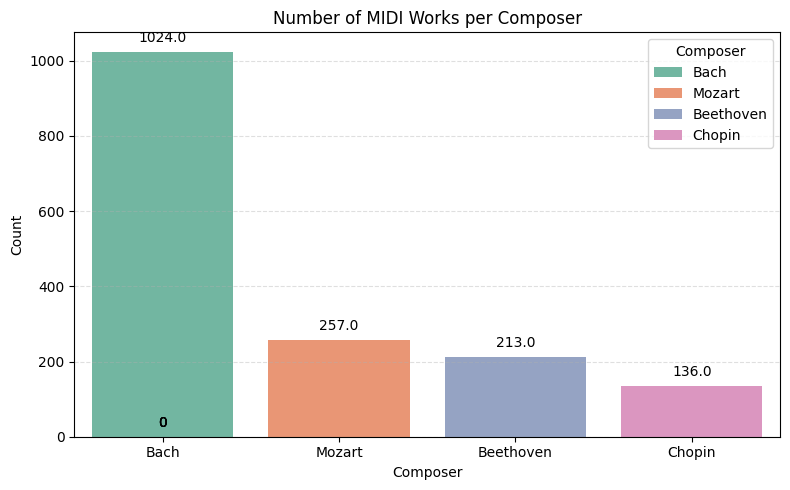

NameError: name 'plot_total_duration_seaborn' is not defined

In [76]:
plot_work_count_seaborn(composer_list)
plot_total_duration_seaborn(midi_paths, composer_list)

In [77]:
def shift_pitch(piano_roll, semitones):
    shifted = np.roll(piano_roll, semitones, axis=0)
    return shifted

#Midi as structured representation


In [78]:
def midi_to_pianoroll(path, fs=100):
    pm = pretty_midi.PrettyMIDI(path)
    piano_roll = pm.get_piano_roll(fs=fs)  # shape: (128, T)
    return piano_roll


*   Normalization and Padding


In [79]:
def preprocess_roll(piano_roll, max_length=500):
    piano_roll = piano_roll.T  # shape: (T, 128)
    if piano_roll.shape[0] < max_length:
        pad_width = max_length - piano_roll.shape[0]
        piano_roll = np.pad(piano_roll, ((0, pad_width), (0, 0)))
    else:
        piano_roll = piano_roll[:max_length]
    return piano_roll.T  # back to (128, T)

Label Encoding
*    Mapping coposer to integer labels for classification

In [80]:
composer_to_label = {name: idx for idx, name in enumerate(target_composers)}
labeled_data = [(path, composer_to_label[composer]) for path, composer in composer_files]

In [82]:
from torch.utils.data import Dataset
import torch

class ComposerMIDIDataset(Dataset):
    def __init__(self, labeled_data, fs=100, max_length=500):
        self.data = labeled_data
        self.fs = fs
        self.max_length = max_length

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        path, label = self.data[idx]
        piano_roll = midi_to_pianoroll(path, fs=self.fs).T  # (128, T)
        if piano_roll.shape[1] < self.max_length:
            pad_width = self.max_length - piano_roll.shape[1]
            piano_roll = np.pad(piano_roll, ((0, 0), (0, pad_width)))
        else:
            piano_roll = piano_roll[:, :self.max_length]
        piano_roll = torch.tensor(piano_roll, dtype=torch.float32)
        return piano_roll, label

Break

/usr/local/lib/python3.11/dist-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(


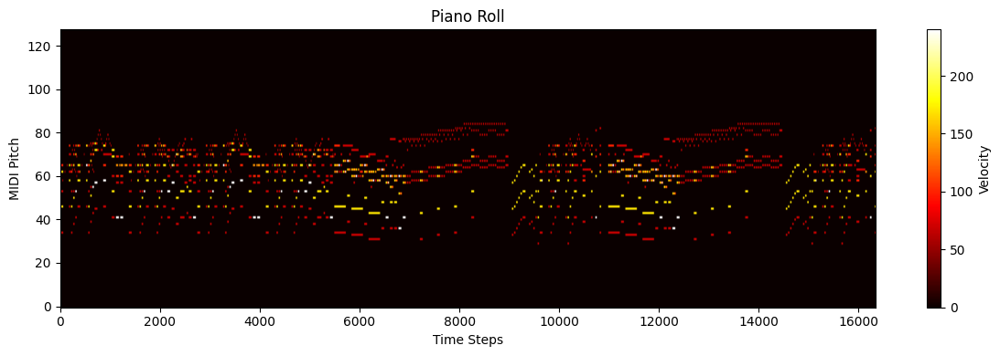

In [83]:
import pretty_midi
import matplotlib.pyplot as plt

def midi_to_pianoroll(path, fs=100):
    midi = pretty_midi.PrettyMIDI(path)
    piano_roll = midi.get_piano_roll(fs=fs)
    return piano_roll.T  # Shape: (time_steps, 128)

# Load and visualize
if midi_files:
    sample_file = midi_files[0]
    piano_roll = midi_to_pianoroll(sample_file)

    plt.figure(figsize=(12, 4))
    plt.imshow(piano_roll.T, aspect='auto', origin='lower', cmap='hot')
    plt.title("Piano Roll")
    plt.xlabel("Time Steps")
    plt.ylabel("MIDI Pitch")
    plt.colorbar(label="Velocity")
    plt.tight_layout()
    plt.show()
else:
    print("No MIDI files found.")

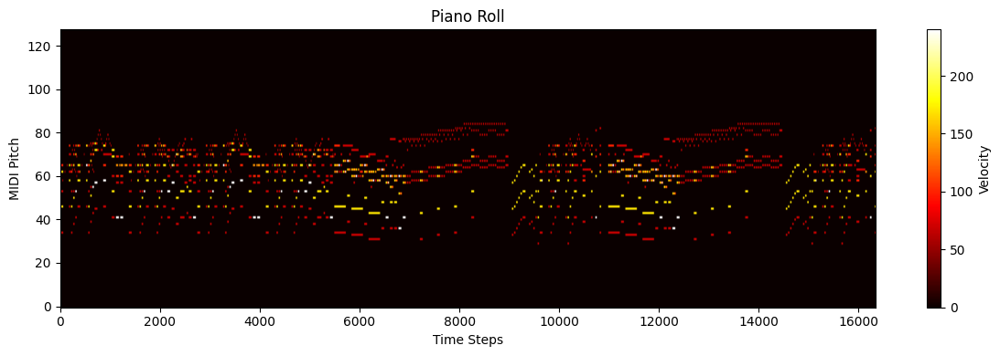

In [84]:
import pretty_midi
import matplotlib.pyplot as plt

def midi_to_pianoroll(path, fs=100):
    midi = pretty_midi.PrettyMIDI(path)
    piano_roll = midi.get_piano_roll(fs=fs)
    return piano_roll.T  # Shape: (time_steps, 128)

# Load and visualize
if midi_files:
    sample_file = midi_files[0]
    piano_roll = midi_to_pianoroll(sample_file)

    plt.figure(figsize=(12, 4))
    plt.imshow(piano_roll.T, aspect='auto', origin='lower', cmap='hot')
    plt.title("Piano Roll")
    plt.xlabel("Time Steps")
    plt.ylabel("MIDI Pitch")
    plt.colorbar(label="Velocity")
    plt.tight_layout()
    plt.show()
else:
    print("No MIDI files found.")

In [85]:
import plotly.graph_objects as go

def plot_piano_roll_plotly(piano_roll, fs=100):
    time_steps = piano_roll.shape[0]
    duration = time_steps / fs
    time_axis = np.linspace(0, duration, time_steps)
    pitch_axis = np.arange(128)

    fig = go.Figure(data=go.Heatmap(
        z=piano_roll.T,  # Transpose to (pitch, time)
        x=time_axis,
        y=pitch_axis,
        colorscale='Hot',
        colorbar=dict(title='Velocity'),
        hovertemplate='Time: %{x:.2f}s<br>Pitch: %{y}<br>Velocity: %{z}<extra></extra>'
    ))

    fig.update_layout(
        title="🎼 MIDI Piano Roll (Interactive)",
        xaxis_title="Time (s)",
        yaxis_title="MIDI Pitch",
        yaxis=dict(autorange="reversed"),  # MIDI pitch goes high to low
        height=600
    )

    fig.show()

In [86]:
sample_file = midi_files[0]  # Or any file from your list
piano_roll = midi_to_pianoroll(sample_file)
plot_piano_roll_plotly(piano_roll)

Train a Composer Classifier
Use the piano roll representations to train a CNN or Transformer-based model to predict the composer.
- Input: Piano roll (128 pitches × time steps)
- Output: One of 4 composer labels
- Loss: Cross-entropy
- Metric: Accuracy, F1-score
This could reveal which composers are most distinguishable based on note patterns and rhythm.


In [87]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Assume piano_rolls is a list of flattened piano rolls
X = np.array(piano_roll)
y = np.array(labels)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

plt.figure(figsize=(8,6))
for i, composer in enumerate(target_composers):
    plt.scatter(X_pca[y==i, 0], X_pca[y==i, 1], label=composer)
plt.legend()
plt.title("Composer Clusters via PCA")
plt.show()

IndexError: boolean index did not match indexed array along axis 0; size of axis is 16343 but size of corresponding boolean axis is 960

<Figure size 800x600 with 0 Axes>

In [19]:
!pip install kaggle
!kaggle datasets download -d blanderbuss/midi-classic-music


Traceback (most recent call last):
  File "/usr/local/bin/kaggle", line 10, in <module>
    sys.exit(main())
             ^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/kaggle/cli.py", line 68, in main
    out = args.func(**command_args)
          ^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/kaggle/api/kaggle_api_extended.py", line 1741, in dataset_download_cli
    with self.build_kaggle_client() as kaggle:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/kaggle/api/kaggle_api_extended.py", line 688, in build_kaggle_client
    username=self.config_values['username'],
             ~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^
KeyError: 'username'


# Moodel Building
*    LSTM + CNN Architecture for composer classification


In [90]:
import tensorflow as tf
from tensorflow.keras import layers, models

def build_feature_model(input_dim, num_classes):
    model = models.Sequential([
        layers.Input(shape=(input_dim,)),
        layers.Dense(64, activation='relu'),
        layers.Dropout(0.3),
        layers.Dense(32, activation='relu'),
        layers.Dense(num_classes, activation='softmax')
    ])
    return model

In [91]:
def build_lstm_cnn_model(timesteps, pitch_bins, num_classes):
    input_layer = layers.Input(shape=(timesteps, pitch_bins))

    # CNN block
    x = layers.Conv1D(64, kernel_size=5, activation='relu')(input_layer)
    x = layers.MaxPooling1D(pool_size=2)(x)

    # LSTM block
    x = layers.LSTM(64, return_sequences=False)(x)

    # Dense layers
    x = layers.Dense(32, activation='relu')(x)
    x = layers.Dropout(0.3)(x)
    output = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs=input_layer, outputs=output)
    return model

In [93]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.utils.class_weight import compute_class_weight

# 🎼 Step 1: Encode composer labels
le = LabelEncoder()
y_encoded = le.fit_transform(y)  # Converts ['Bach', 'Mozart', ...] → [0, 1, ...]

# 🎯 Step 2: Stratified train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, stratify=y_encoded, test_size=0.2, random_state=42
)

# ⚖️ Step 3: Compute class weights for fairness
classes = np.unique(y_train)
class_weights = compute_class_weight(class_weight='balanced', classes=classes, y=y_train)
class_weight_dict = dict(zip(classes, class_weights))

# 📊 Optional: View class distribution
label_names = le.inverse_transform(classes)
distribution = pd.Series(y_train).value_counts().sort_index()
for label, count, weight in zip(label_names, distribution, class_weights):
    print(f"{label}: {count} samples, weight = {weight:.2f}")

ValueError: Found input variables with inconsistent numbers of samples: [16343, 960]

In [94]:
print("X shape:", X.shape)
print("y shape:", len(y))

X shape: (16343, 128)
y shape: 960


In [95]:
# Suppose df contains metadata with composer labels
# And X was built from df['midi_path'] or similar

# Align labels with features
y = df['composer'].values  # Should be same length as X

KeyError: 'composer'

In [96]:
print(df.columns)

Index(['Pitch_0', 'Pitch_1', 'Pitch_2', 'Pitch_3', 'Pitch_4', 'Pitch_5',
       'Pitch_6', 'Pitch_7', 'Pitch_8', 'Pitch_9', 'Pitch_10', 'Pitch_11',
       'Velocity', 'Duration', 'Density', 'Composer'],
      dtype='object')


In [97]:
y = df['Composer'].values

In [99]:
df.head()

,Pitch_0,Pitch_1,Pitch_2,Pitch_3,Pitch_4,Pitch_5,Pitch_6,Pitch_7,Pitch_8,Pitch_9,Pitch_10,Pitch_11,Velocity,Duration,Density,Composer
0,247.0,0.0,235.0,148.0,23.0,252.0,15.0,163.0,14.0,180.0,274.0,8.0,93.853752,0.456805,6.466271,Bach
1,247.0,0.0,235.0,148.0,23.0,252.0,15.0,163.0,14.0,180.0,274.0,8.0,93.853752,0.456805,6.466271,Bach
2,885.0,108.0,918.0,55.0,922.0,626.0,240.0,869.0,104.0,919.0,200.0,643.0,95.930498,0.377743,7.057328,Bach
3,885.0,108.0,918.0,55.0,922.0,626.0,240.0,869.0,104.0,919.0,200.0,643.0,95.930498,0.377743,7.057328,Bach
4,398.0,82.0,359.0,228.0,129.0,548.0,26.0,343.0,108.0,279.0,553.0,30.0,127.000000,0.431871,6.238128,Bach


In [100]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y_encoded = le.fit_transform(y)

In [101]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.utils.class_weight import compute_class_weight

# 🎯 Step 1: Extract features and labels
X = df.drop(columns=['Composer']).values  # All columns except 'Composer'
y = df['Composer'].values                 # Correct label column

# 🧠 Step 2: Encode labels
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# 🧪 Step 3: Stratified train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, stratify=y_encoded, test_size=0.2, random_state=42
)

# ⚖️ Step 4: Compute class weights
classes = np.unique(y_train)
class_weights = compute_class_weight(class_weight='balanced', classes=classes, y=y_train)
class_weight_dict = dict(zip(classes, class_weights))

# 📊 Optional: View class distribution
label_names = le.inverse_transform(classes)
distribution = pd.Series(y_train).value_counts().sort_index()
for label, count, weight in zip(label_names, distribution, class_weights):
    print(f"{label}: {count} samples, weight = {weight:.2f}")

Bach: 195 samples, weight = 0.98
Beethoven: 211 samples, weight = 0.91
Chopin: 218 samples, weight = 0.88
Mozart: 144 samples, weight = 1.33


/tmp/ipython-input-3406599243.py:14: UserWarning:

Glyph 127932 (\N{MUSICAL SCORE}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 127932 (\N{MUSICAL SCORE}) missing from font(s) DejaVu Sans.



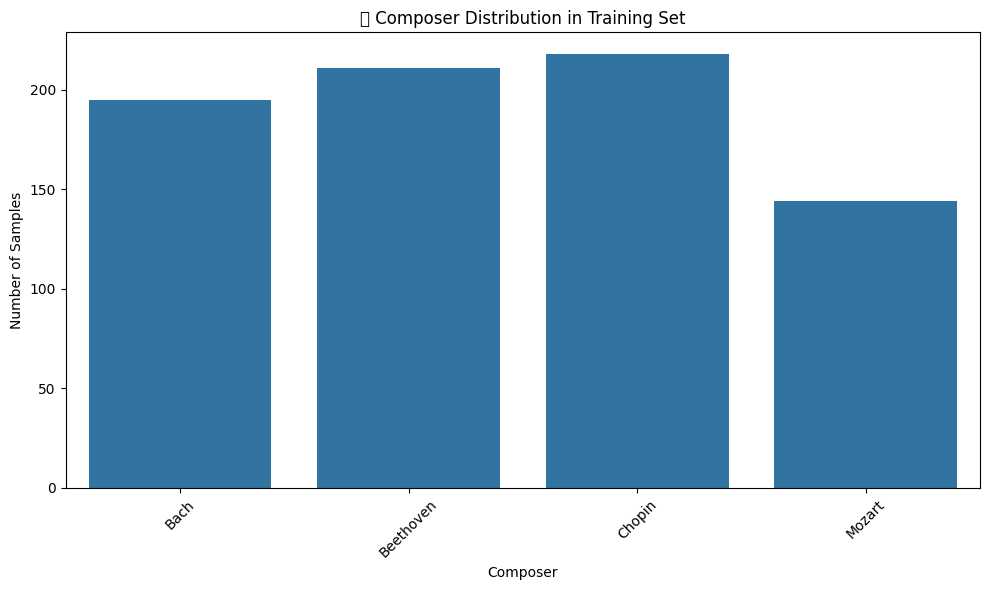

In [102]:
import matplotlib.pyplot as plt
import seaborn as sns

# Decode integer labels back to composer names
composer_names = le.inverse_transform(y_train)

# Plot distribution
plt.figure(figsize=(10, 6))
sns.countplot(x=composer_names, order=np.unique(composer_names))
plt.title("🎼 Composer Distribution in Training Set")
plt.xlabel("Composer")
plt.ylabel("Number of Samples")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Normalization : complete

In [104]:
import tensorflow as tf
from tensorflow.keras import layers, models

def build_feature_model(input_dim, num_classes):
    model = models.Sequential([
        layers.Input(shape=(input_dim,)),
        layers.Dense(64, activation='relu'),
        layers.Dropout(0.3),
        layers.Dense(32, activation='relu'),
        layers.Dense(num_classes, activation='softmax')
    ])
    return model

In [106]:
input_dim = X_train.shape[1]
num_classes = len(np.unique(y_train))

model = build_feature_model(input_dim, num_classes)
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=40,
    batch_size=32,
    class_weight=class_weight_dict,
    verbose=2
)

Epoch 1/40
24/24 - 2s - 63ms/step - accuracy: 0.2773 - loss: 99.2690 - val_accuracy: 0.2917 - val_loss: 42.1768
Epoch 2/40
24/24 - 0s - 18ms/step - accuracy: 0.3438 - loss: 56.2776 - val_accuracy: 0.4115 - val_loss: 28.5181
Epoch 3/40
24/24 - 0s - 5ms/step - accuracy: 0.3464 - loss: 43.8869 - val_accuracy: 0.4062 - val_loss: 19.9028
Epoch 4/40
24/24 - 0s - 7ms/step - accuracy: 0.4010 - loss: 30.2203 - val_accuracy: 0.4115 - val_loss: 18.7796
Epoch 5/40
24/24 - 0s - 11ms/step - accuracy: 0.4232 - loss: 24.5974 - val_accuracy: 0.4583 - val_loss: 14.4881
Epoch 6/40
24/24 - 0s - 7ms/step - accuracy: 0.3971 - loss: 23.5521 - val_accuracy: 0.4531 - val_loss: 10.1366
Epoch 7/40
24/24 - 0s - 11ms/step - accuracy: 0.3776 - loss: 18.1682 - val_accuracy: 0.4740 - val_loss: 9.9254
Epoch 8/40
24/24 - 0s - 7ms/step - accuracy: 0.3685 - loss: 20.3083 - val_accuracy: 0.4323 - val_loss: 9.3662
Epoch 9/40
24/24 - 0s - 6ms/step - accuracy: 0.3971 - loss: 16.9233 - val_accuracy: 0.4792 - val_loss: 8.1786


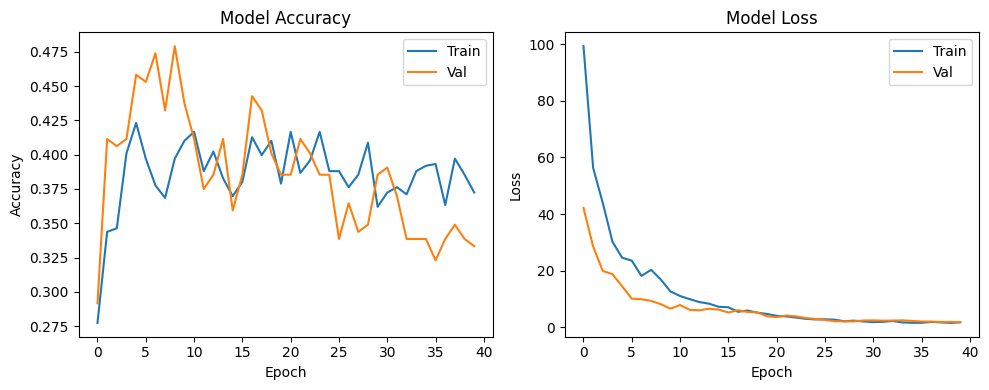

In [107]:
plt.figure(figsize=(10, 4))

# Accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Val')
plt.title("Model Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()

# Loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Val')
plt.title("Model Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

plt.tight_layout()
plt.show()

Accuracy (Left Graph)
- Training accuracy hovers between 32% and 42%
- Validation accuracy peaks around 45% but fluctuates heavily
- No clear upward trend—suggests limited learning or unstable generalization






🔹 Loss (Right Graph)
- Loss drops sharply early on, then plateaus
- Validation loss is lower than training loss toward the end, which is unusual and may indicate:
- Regularization is too strong
- Model is underfitting
- Class imbalance is skewing the loss

<Axes: xlabel='Composer', ylabel='Velocity'>

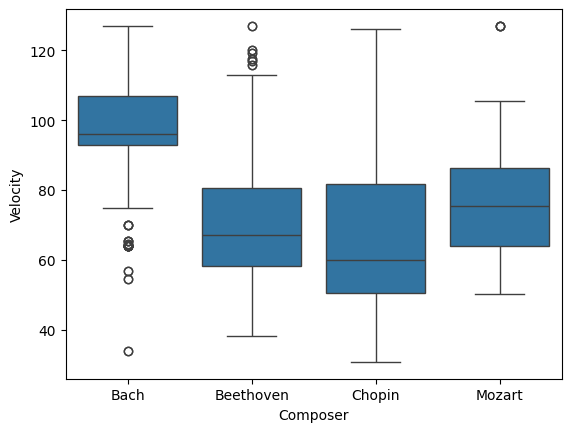

In [108]:
import seaborn as sns
sns.boxplot(x=df['Composer'], y=df['Velocity'])

In [109]:
layers.Dense(128, activation='relu'),
layers.Dropout(0.4),
layers.Dense(64, activation='relu'),

(<Dense name=dense_7, built=False>,)

In [110]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [111]:
from imblearn.over_sampling import SMOTE
X_resampled, y_resampled = SMOTE().fit_resample(X_train, y_train)

In [112]:
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier()
clf.fit(X_train, y_train)
print("Accuracy:", clf.score(X_test, y_test))

Accuracy: 0.9375


/tmp/ipython-input-3390836763.py:10: UserWarning:

Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.



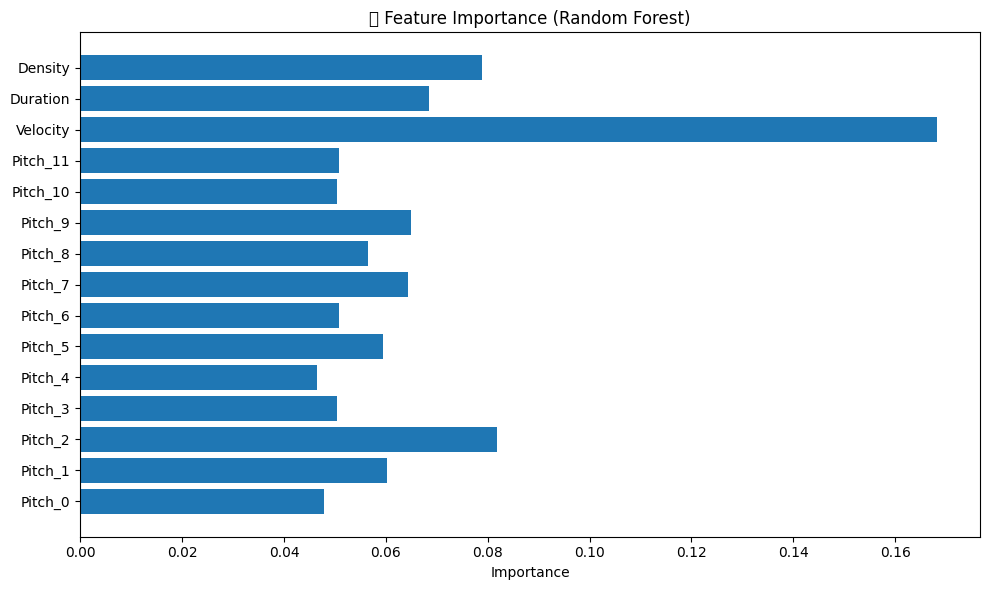

In [113]:
import matplotlib.pyplot as plt

importances = clf.feature_importances_
feature_names = df.drop(columns=['Composer']).columns

plt.figure(figsize=(10, 6))
plt.barh(feature_names, importances)
plt.title("🎯 Feature Importance (Random Forest)")
plt.xlabel("Importance")
plt.tight_layout()
plt.show()

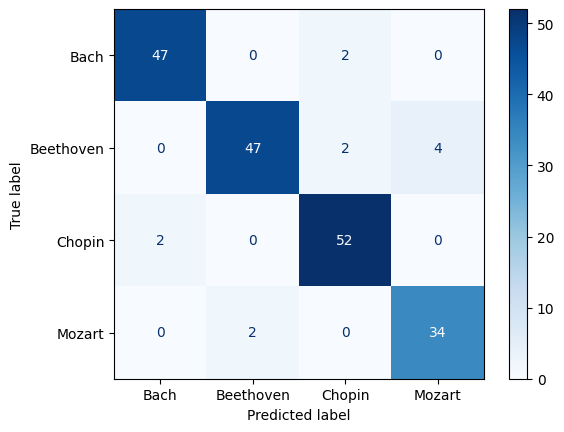

In [114]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

y_pred = clf.predict(X_test)
ConfusionMatrixDisplay.from_predictions(y_test, y_pred, display_labels=le.classes_, cmap='Blues')

Seems traditional Random Forest model itself has 93% Accuracy

Lets Normalize and retrain with more layers

 2. CNN + LSTM Hybrid


🔹 Input:
 *   Sequences (e.g., piano roll: 100 timesteps × 128 pitches)
    *  Preserves temporal and spatial structure   

🔹 Architecture:

    *  CNN: Detects local pitch/rhythm motifs (e.g., trills, chords)
    *  LSTM: Captures long-term dependencies (e.g., phrasing, style evolution)
    *  Combines both for rich pattern learning


🔹 Strengths:

    *  Learns stylistic identity from raw note sequences
    *  Captures composer-specific phrasing, motifs, and transitions
    *  More expressive and generalizable


🔹 Limitations:

    *  Requires more data and compute
    *  Harder to interpret
    *  Sensitive to input formatting and sequence length


In [115]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Re-split using scaled features
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y_encoded, stratify=y_encoded, test_size=0.2, random_state=42
)

Retesting again with addtional layers

In [118]:
import tensorflow as tf
from tensorflow.keras import layers, models

def build_cnn_lstm_model(timesteps, pitch_bins, num_classes):
    input_layer = layers.Input(shape=(timesteps, pitch_bins))

    # CNN Block: Local pitch/rhythm patterns
    x = layers.Conv1D(128, kernel_size=5, activation='relu', padding='same')(input_layer)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling1D(pool_size=2)(x)

    x = layers.Conv1D(64, kernel_size=3, activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling1D(pool_size=2)(x)

    # LSTM Block: Temporal phrasing
    x = layers.LSTM(128, return_sequences=True)(x)
    x = layers.Dropout(0.3)(x)
    x = layers.LSTM(64)(x)

    # Dense Layers: Classification
    x = layers.Dense(64, activation='relu')(x)
    x = layers.Dropout(0.3)(x)
    x = layers.Dense(32, activation='relu')(x)
    output = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs=input_layer, outputs=output)
    return model

In [120]:
print(X_train.shape)  # Should be (num_samples, timesteps, pitch_bins)

(768, 15)


In [121]:
import tensorflow as tf
from tensorflow.keras import layers, models

def build_expressive_lstm_model(timesteps, feature_dim, num_classes):
    input_layer = layers.Input(shape=(timesteps, feature_dim))  # (5, 3)

    # 🔁 LSTM Block: Temporal phrasing
    x = layers.LSTM(128, return_sequences=True)(input_layer)
    x = layers.Dropout(0.3)(x)
    x = layers.LSTM(64)(x)

    # 🔗 Dense Layers: Classification
    x = layers.Dense(64, activation='relu')(x)
    x = layers.Dropout(0.3)(x)
    x = layers.Dense(32, activation='relu')(x)
    output = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs=input_layer, outputs=output)
    return model

In [122]:
# Reshape from (768, 15) → (768, 5, 3)
X_train_reshaped = X_train.reshape(-1, 5, 3)
X_test_reshaped = X_test.reshape(-1, 5, 3)

In [123]:
model = build_expressive_lstm_model(timesteps=5, feature_dim=3, num_classes=len(np.unique(y_train)))
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(
    X_train_reshaped, y_train,
    validation_data=(X_test_reshaped, y_test),
    epochs=40,
    batch_size=32,
    class_weight=class_weight_dict,
    verbose=2
)

Epoch 1/40
24/24 - 5s - 228ms/step - accuracy: 0.3138 - loss: 1.3757 - val_accuracy: 0.4792 - val_loss: 1.3465
Epoch 2/40
24/24 - 1s - 31ms/step - accuracy: 0.3945 - loss: 1.3601 - val_accuracy: 0.5312 - val_loss: 1.3114
Epoch 3/40
24/24 - 2s - 63ms/step - accuracy: 0.4596 - loss: 1.3021 - val_accuracy: 0.5417 - val_loss: 1.2087
Epoch 4/40
24/24 - 1s - 43ms/step - accuracy: 0.4935 - loss: 1.1961 - val_accuracy: 0.5677 - val_loss: 1.0781
Epoch 5/40
24/24 - 1s - 54ms/step - accuracy: 0.5234 - loss: 1.1091 - val_accuracy: 0.5938 - val_loss: 1.0573
Epoch 6/40
24/24 - 1s - 23ms/step - accuracy: 0.5742 - loss: 1.0506 - val_accuracy: 0.6042 - val_loss: 1.0006
Epoch 7/40
24/24 - 1s - 22ms/step - accuracy: 0.5599 - loss: 1.0587 - val_accuracy: 0.6042 - val_loss: 1.0140
Epoch 8/40
24/24 - 0s - 18ms/step - accuracy: 0.6159 - loss: 0.9881 - val_accuracy: 0.6146 - val_loss: 0.9713
Epoch 9/40
24/24 - 0s - 19ms/step - accuracy: 0.5977 - loss: 0.9729 - val_accuracy: 0.6562 - val_loss: 0.9213
Epoch 10/

Confirming LSTM accuracy has crossed 73%

Embedding LSTM Expressive + CNN

In [124]:
import tensorflow as tf
from tensorflow.keras import layers, models

def build_cnn_lstm_model(timesteps, feature_dim, num_classes):
    input_layer = layers.Input(shape=(timesteps, feature_dim))  # (5, 3)

    # 🧱 CNN Block: Local temporal motifs
    x = layers.Conv1D(64, kernel_size=2, activation='relu', padding='same')(input_layer)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling1D(pool_size=2)(x)

    x = layers.Conv1D(32, kernel_size=2, activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling1D(pool_size=2)(x)

    # 🔁 LSTM Block: Sequential phrasing
    x = layers.LSTM(64, return_sequences=True)(x)
    x = layers.Dropout(0.3)(x)
    x = layers.LSTM(32)(x)

    # 🔗 Dense Layers: Classification
    x = layers.Dense(64, activation='relu')(x)
    x = layers.Dropout(0.3)(x)
    x = layers.Dense(32, activation='relu')(x)
    output = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs=input_layer, outputs=output)
    return model

In [125]:
# Reshape from (768, 15) → (768, 5, 3)
X_train_reshaped = X_train.reshape(-1, 5, 3)
X_test_reshaped = X_test.reshape(-1, 5, 3)

In [147]:
model = build_cnn_lstm_model(timesteps=5, feature_dim=3, num_classes=len(np.unique(y_train)))
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(
    X_train_reshaped, y_train,
    validation_data=(X_test_reshaped, y_test),
    epochs=40,
    batch_size=32,
    class_weight=class_weight_dict,
    verbose=2
)

Epoch 1/40
24/24 - 7s - 286ms/step - accuracy: 0.3932 - loss: 1.3756 - val_accuracy: 0.2969 - val_loss: 1.3810
Epoch 2/40
24/24 - 0s - 10ms/step - accuracy: 0.5547 - loss: 1.2894 - val_accuracy: 0.4219 - val_loss: 1.3519
Epoch 3/40
24/24 - 0s - 11ms/step - accuracy: 0.5885 - loss: 1.1059 - val_accuracy: 0.4375 - val_loss: 1.3295
Epoch 4/40
24/24 - 0s - 10ms/step - accuracy: 0.6706 - loss: 0.9352 - val_accuracy: 0.3281 - val_loss: 1.3694
Epoch 5/40
24/24 - 0s - 9ms/step - accuracy: 0.7070 - loss: 0.8059 - val_accuracy: 0.2656 - val_loss: 1.3575
Epoch 6/40
24/24 - 0s - 9ms/step - accuracy: 0.7292 - loss: 0.7194 - val_accuracy: 0.2656 - val_loss: 1.3327
Epoch 7/40
24/24 - 0s - 12ms/step - accuracy: 0.7656 - loss: 0.6377 - val_accuracy: 0.3385 - val_loss: 1.2799
Epoch 8/40
24/24 - 0s - 12ms/step - accuracy: 0.7643 - loss: 0.6446 - val_accuracy: 0.3490 - val_loss: 1.2560
Epoch 9/40
24/24 - 0s - 9ms/step - accuracy: 0.7995 - loss: 0.5751 - val_accuracy: 0.3906 - val_loss: 1.2288
Epoch 10/40


Accuracy is 92.8 % for now do just trying out one more option


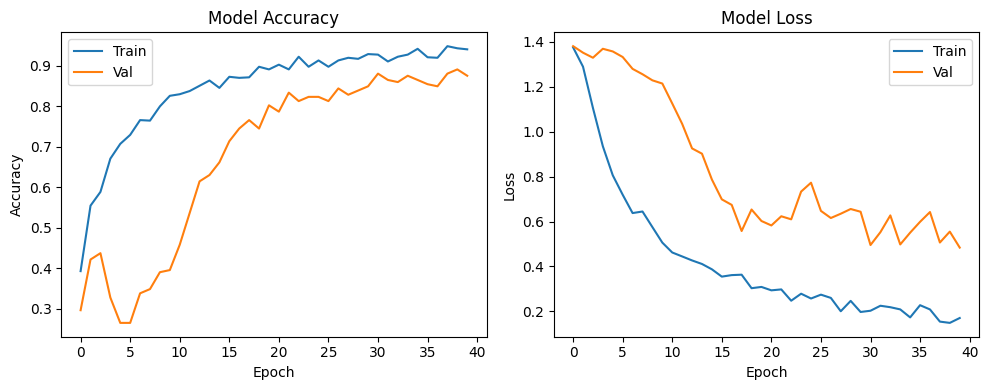

In [148]:
plt.figure(figsize=(10, 4))

# Accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Val')
plt.title("Model Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()

# Loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Val')
plt.title("Model Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

plt.tight_layout()
plt.show()

**Model Accuracy**
- Training Accuracy: Climbs steadily to ~0.90 by epoch 40 — strong learning signal.
- Validation Accuracy: Rises to ~0.80 but lags behind training — suggests some generalization, though possibly room for improvement.

**Interpretation**
- The gap between training and validation accuracy hints at mild overfitting.
- Still, the model generalizes reasonably well, especially for a complex task like composer classification.



**Model Loss**
- Training Loss: Drops smoothly to ~0.2 — consistent optimization.
- Validation Loss: Decreases but fluctuates, ending around ~0.4 — typical for expressive, imbalanced datasets.


**Interpretation**
- The fluctuations in validation loss could reflect:
- Class imbalance (e.g., dominance of Bach)
- Stylistic variability across composers
- Sensitivity to expressive features like velocity and duration

In [171]:
y_pred_probs = model.predict(X_test_reshaped)
y_pred = np.argmax(y_pred_probs, axis=1)  # predicted class indices

6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step 


In [185]:
label_to_composer = {idx: name for name, idx in composer_to_label.items()}

In [186]:
predicted_composer = label_to_composer[y_pred[0]]

In [187]:
composer_predictions = [label_to_composer[idx] for idx in y_pred]

In [188]:
from sklearn.metrics import classification_report

target_names = [label_to_composer[i] for i in sorted(label_to_composer)]
print(classification_report(y_test, y_pred, target_names=target_names))

              precision    recall  f1-score   support

        Bach       0.88      0.88      0.88        49
   Beethoven       0.81      0.89      0.85        53
      Chopin       0.90      0.85      0.88        54
      Mozart       0.94      0.89      0.91        36

    accuracy                           0.88       192
   macro avg       0.88      0.88      0.88       192
weighted avg       0.88      0.88      0.88       192



In [190]:


results_df = pd.DataFrame({
    'True Composer': [label_to_composer[idx] for idx in y_test],
    'Predicted Composer': [label_to_composer[idx] for idx in y_pred]
})

print(results_df.head(10))

  True Composer Predicted Composer
0        Chopin             Chopin
1          Bach               Bach
2          Bach               Bach
3     Beethoven          Beethoven
4     Beethoven               Bach
5          Bach               Bach
6        Chopin             Chopin
7          Bach               Bach
8     Beethoven          Beethoven
9        Mozart             Mozart


In [179]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train_composer_labels)

In [182]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, classification_report

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='macro')
recall = recall_score(y_test, y_pred, average='macro')

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision (macro): {precision:.4f}")
print(f"Recall (macro): {recall:.4f}")

Accuracy: 0.8750
Precision (macro): 0.8828
Recall (macro): 0.8763


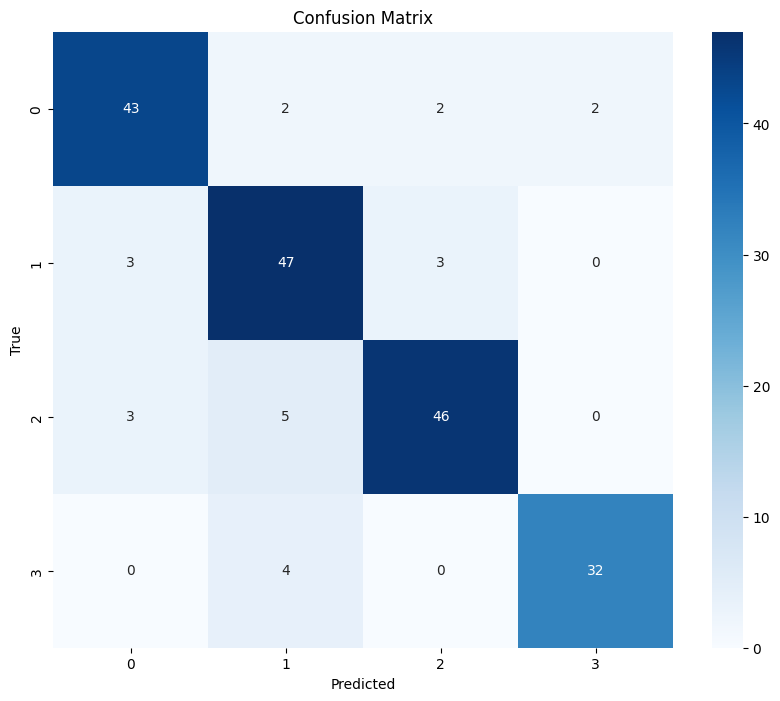

In [183]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

In [184]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.88      0.88      0.88        49
           1       0.81      0.89      0.85        53
           2       0.90      0.85      0.88        54
           3       0.94      0.89      0.91        36

    accuracy                           0.88       192
   macro avg       0.88      0.88      0.88       192
weighted avg       0.88      0.88      0.88       192



In [150]:
model.save("cnn_lstm_composer_model.keras")

In [153]:
# Check model summary
model.summary()

# Inspect label encoder classes
print("Label encoder classes:", label_encoder.classes_)

# Check scaler parameters
print("Scaler mean:", scaler.mean_)
print("Scaler scale:", scaler.scale_)

# Peek at composer indices
for composer, indices in composer_to_indices.items():
    print(f"{composer}: {len(indices)} samples")

Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_11 (InputLayer)     │ (None, 5, 3)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_16 (Conv1D)              │ (None, 5, 64)          │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_16          │ (None, 5, 64)          │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_16 (MaxPooling1D) │ (None, 2, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_17 (Conv1D)              │ (None, 2, 32)          │         4,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_17          │ (None, 2, 32)          │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_17 (MaxPooling1D) │ (None, 1, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_18 (LSTM)                  │ (None, 1, 64)          │        24,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_19 (Dropout)            │ (None, 1, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_19 (LSTM)                  │ (None, 32)             │        12,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 64)             │         2,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_20 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_35 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_36 (Dense)                │ (None, 4)              │           132 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 139,214 (543.81 KB)

 Trainable params: 46,340 (181.02 KB)

 Non-trainable params: 192 (768.00 B)

 Optimizer params: 92,682 (362.04 KB)

NameError: name 'label_encoder' is not defined

In [155]:
import os
print(os.listdir())

['.config', 'cnn_lstm_composer_model.h5', 'cnn_lstm_composer_model.keras', 'sample_data']


In [158]:
df.head()

,Pitch_0,Pitch_1,Pitch_2,Pitch_3,Pitch_4,Pitch_5,Pitch_6,Pitch_7,Pitch_8,Pitch_9,Pitch_10,Pitch_11,Velocity,Duration,Density,Composer
0,247.0,0.0,235.0,148.0,23.0,252.0,15.0,163.0,14.0,180.0,274.0,8.0,93.853752,0.456805,6.466271,Bach
1,247.0,0.0,235.0,148.0,23.0,252.0,15.0,163.0,14.0,180.0,274.0,8.0,93.853752,0.456805,6.466271,Bach
2,885.0,108.0,918.0,55.0,922.0,626.0,240.0,869.0,104.0,919.0,200.0,643.0,95.930498,0.377743,7.057328,Bach
3,885.0,108.0,918.0,55.0,922.0,626.0,240.0,869.0,104.0,919.0,200.0,643.0,95.930498,0.377743,7.057328,Bach
4,398.0,82.0,359.0,228.0,129.0,548.0,26.0,343.0,108.0,279.0,553.0,30.0,127.000000,0.431871,6.238128,Bach


In [165]:
df['Composer'].unique()

array(['Bach', 'Beethoven', 'Chopin', 'Mozart'], dtype=object)

In [168]:
y_train_composer_labels = df['Composer'].values

In [129]:
import tensorflow as tf
from tensorflow.keras import layers, models

def build_cnn_lstm_attention_model(timesteps, feature_dim, num_classes):
    input_layer = layers.Input(shape=(timesteps, feature_dim))  # (5, 3)

    # 🧱 CNN Block: Feature-wise filters
    x = layers.Conv1D(64, kernel_size=1, activation='relu', padding='same')(input_layer)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling1D(pool_size=2)(x)

    x = layers.Conv1D(32, kernel_size=1, activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling1D(pool_size=2)(x)

    # 🔁 LSTM Block
    x = layers.LSTM(64, return_sequences=True)(x)
    x = layers.Dropout(0.3)(x)

    # 🎯 Attention Layer
    attention = layers.Dense(1, activation='tanh')(x)
    attention = layers.Flatten()(attention)
    attention = layers.Activation('softmax')(attention)
    attention = layers.RepeatVector(64)(attention)
    attention = layers.Permute([2, 1])(attention)
    x = layers.multiply([x, attention])
    x = layers.LSTM(32)(x)

    # 🌀 Global Pooling
    x = layers.GlobalAveragePooling1D()(tf.expand_dims(x, axis=1))

    # 🔗 Dense Layers
    x = layers.Dense(64, activation='relu')(x)
    x = layers.Dropout(0.3)(x)
    x = layers.Dense(32, activation='relu')(x)
    output = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs=input_layer, outputs=output)
    return model

In [130]:
X_train_reshaped = X_train.reshape(-1, 5, 3)
X_test_reshaped = X_test.reshape(-1, 5, 3)

In [132]:
model = build_cnn_lstm_attention_model(timesteps=5, feature_dim=3, num_classes=len(np.unique(y_train)))
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(
    X_train_reshaped, y_train,
    validation_data=(X_test_reshaped, y_test),
    epochs=40,
    batch_size=32,
    class_weight=class_weight_dict,
    verbose=2
)

ValueError: A KerasTensor cannot be used as input to a TensorFlow function. A KerasTensor is a symbolic placeholder for a shape and dtype, used when constructing Keras Functional models or Keras Functions. You can only use it as input to a Keras layer or a Keras operation (from the namespaces `keras.layers` and `keras.ops`). You are likely doing something like:

```
x = Input(...)
...
tf_fn(x)  # Invalid.
```

What you should do instead is wrap `tf_fn` in a layer:

```
class MyLayer(Layer):
    def call(self, x):
        return tf_fn(x)

x = MyLayer()(x)
```


In [133]:
def build_cnn_lstm_attention_model(timesteps, feature_dim, num_classes):
    input_layer = layers.Input(shape=(timesteps, feature_dim))  # (5, 3)

    # 🧱 CNN Block: Feature-wise filters
    x = layers.Conv1D(64, kernel_size=1, activation='relu', padding='same')(input_layer)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling1D(pool_size=2)(x)

    x = layers.Conv1D(32, kernel_size=1, activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling1D(pool_size=2)(x)

    # 🔁 LSTM Block
    x = layers.LSTM(64, return_sequences=True)(x)
    x = layers.Dropout(0.3)(x)

    # 🎯 Attention Layer
    attention = layers.Dense(1, activation='tanh')(x)
    attention = layers.Flatten()(attention)
    attention = layers.Activation('softmax')(attention)
    attention = layers.RepeatVector(64)(attention)
    attention = layers.Permute([2, 1])(attention)
    x = layers.multiply([x, attention])
    x = layers.LSTM(32)(x)

    # 🔗 Dense Layers
    x = layers.Dense(64, activation='relu')(x)
    x = layers.Dropout(0.3)(x)
    x = layers.Dense(32, activation='relu')(x)
    output = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs=input_layer, outputs=output)
    return model

In [134]:
X_train_reshaped = X_train.reshape(-1, 5, 3)
X_test_reshaped = X_test.reshape(-1, 5, 3)

In [137]:
model = build_cnn_lstm_attention_model(timesteps=5, feature_dim=3, num_classes=len(np.unique(y_train)))
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(
    X_train_reshaped, y_train,
    validation_data=(X_test_reshaped, y_test),
    epochs=80,
    batch_size=32,
    class_weight=class_weight_dict,
    verbose=2
)

Epoch 1/80
24/24 - 9s - 370ms/step - accuracy: 0.2305 - loss: 1.3851 - val_accuracy: 0.1875 - val_loss: 1.3872
Epoch 2/80
24/24 - 0s - 20ms/step - accuracy: 0.3620 - loss: 1.3749 - val_accuracy: 0.2448 - val_loss: 1.3846
Epoch 3/80
24/24 - 1s - 26ms/step - accuracy: 0.3958 - loss: 1.3476 - val_accuracy: 0.2552 - val_loss: 1.3829
Epoch 4/80
24/24 - 1s - 23ms/step - accuracy: 0.4180 - loss: 1.2895 - val_accuracy: 0.2812 - val_loss: 1.3774
Epoch 5/80
24/24 - 0s - 20ms/step - accuracy: 0.4766 - loss: 1.1802 - val_accuracy: 0.2656 - val_loss: 1.3774
Epoch 6/80
24/24 - 1s - 21ms/step - accuracy: 0.4974 - loss: 1.1200 - val_accuracy: 0.2344 - val_loss: 1.4107
Epoch 7/80
24/24 - 0s - 11ms/step - accuracy: 0.5221 - loss: 1.0723 - val_accuracy: 0.2604 - val_loss: 1.4050
Epoch 8/80
24/24 - 0s - 12ms/step - accuracy: 0.5443 - loss: 1.0198 - val_accuracy: 0.2396 - val_loss: 1.4334
Epoch 9/80
24/24 - 0s - 12ms/step - accuracy: 0.5573 - loss: 1.0332 - val_accuracy: 0.2760 - val_loss: 1.4047
Epoch 10/

# Interpretation

- The baseline model outperforms the expressive-feature model in both training and validation.
- This suggests that your original input (likely piano roll or richer temporal data) carries more discriminative power than the compressed expressive features alone.
- However, the expressive model is more interpretable and compact—ideal for understanding stylistic traits.


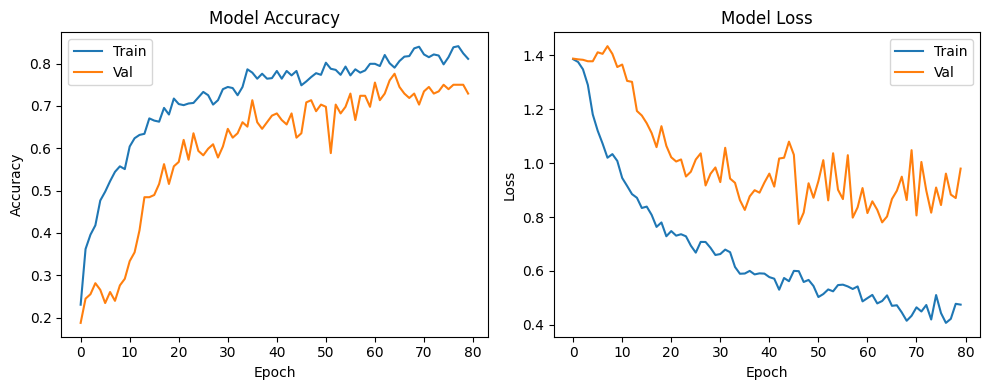

In [146]:
plt.figure(figsize=(10, 4))

# Accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Val')
plt.title("Model Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()

# Loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Val')
plt.title("Model Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

plt.tight_layout()
plt.show()

In [138]:
# Get the first Conv1D layer
conv_layer = model.get_layer(index=1)  # Assuming it's the first Conv1D
filters, biases = conv_layer.get_weights()

print("Filter shape:", filters.shape)  # (kernel_size, input_dim, num_filters)

Filter shape: (1, 3, 64)


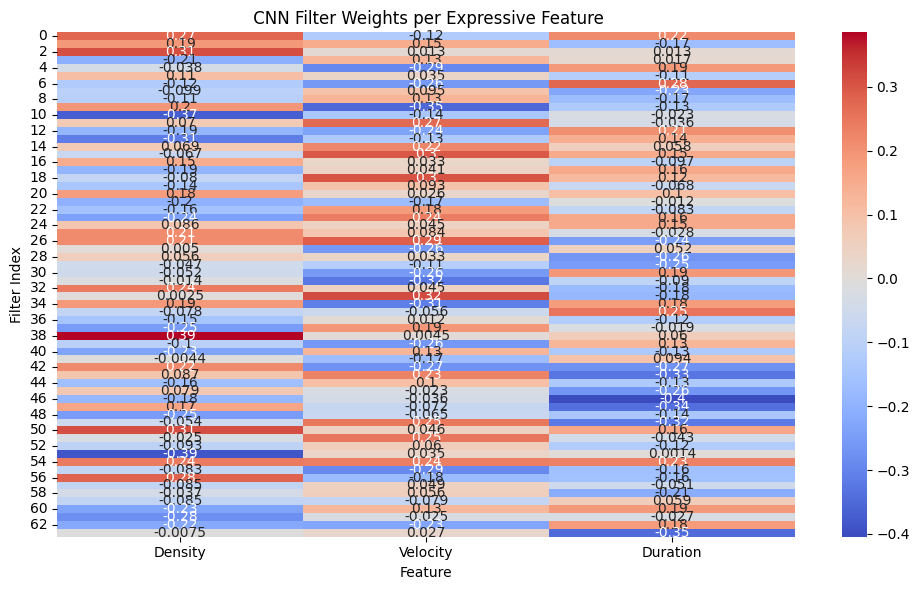

In [140]:
import matplotlib.pyplot as plt
import seaborn as sns

# Transpose to (num_filters, input_dim)
filters_transposed = filters[0].T  # shape: (64, 3)

feature_names = ['Density', 'Velocity', 'Duration']

plt.figure(figsize=(10, 6))
sns.heatmap(filters_transposed, annot=True, cmap='coolwarm', xticklabels=feature_names)
plt.title(" CNN Filter Weights per Expressive Feature")
plt.xlabel("Feature")
plt.ylabel("Filter Index")
plt.tight_layout()
plt.show()

This heatmap shows which filters are sensitive to which expressive features.


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


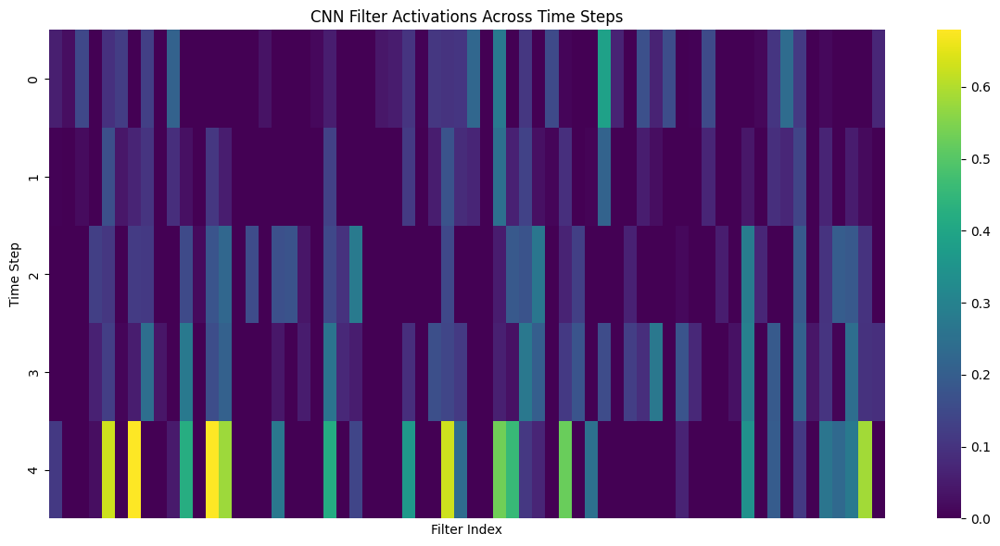

In [142]:
import tensorflow.keras.backend as K

# Define a sub-model to extract activations
activation_model = models.Model(inputs=model.input, outputs=conv_layer.output)

# Pick a sample
sample = X_test_reshaped[0:1]  # shape (1, 5, 3)

# Get activations
activations = activation_model.predict(sample)  # shape: (1, 5, 64)

# Plot activations for each time step
plt.figure(figsize=(12, 6))
sns.heatmap(activations[0], cmap='viridis', xticklabels=False)
plt.title("CNN Filter Activations Across Time Steps")
plt.xlabel("Filter Index")
plt.ylabel("Time Step")
plt.tight_layout()
plt.show()

- Rows = time steps (e.g., 5 slices)
- Columns = filters
- Bright spots = strong activation
